# Optimising and solving for calibration parameters.


---


The goal for this notebook is to walk through the decisions and steps to find the optimal calibration parameters between the lidar and camera data. 

<br>

When transforming betweeen the two, there are the following steps:
 -  lorem
 - ipsum
 - TODO 
 

# Using Dill to restore previous session
---
<br>
<br>
<br>
<br>



In [78]:
import dill

figpath = r"../Writeup/Figures/"


In [79]:
# dill.load_session('Optimisation.db')

In [80]:
# If this spits out a whole bunch of text it's working. 
# data.calib

<br>
<br>
<br>
<br>
Now you should be able to jump straight to the section

### [Gradient Ascent by Variable](#gradAscByVar)
<br>
<br>
<br>
<br>
<br>
<br>



# Imports and Setup
---
<br>
<br>
<br>
<br>


In [81]:
%matplotlib notebook
# %matplotlib inline
# If in Jupyter Lab

# If running dark mode
# from jupyterthemes import jtplot
# jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False)


from jupyterthemes import jtplot
jtplot.style(theme='grade3', context='notebook', ticks=True, grid=False)

In [82]:
import numpy as np
import pykitti
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d
import cv2
import copy

from scipy.stats import norm, gaussian_kde

import statsmodels.api as sm

from IPython.display import display, Markdown

from PIL import Image

from GetPyKitti import getPyKittiData

## Importing the other bits of the project so far

In [83]:
from KDE_and_Mutual_Information import *
# from img_create_and_ops import *
from render_lidar_on_cam import *
from Lidar_Cam_Operations import *

In [84]:
data = getPyKittiData()
frame_num = 2
veloData = data.get_velo(frame_num)
pc_velo = veloData[:, :3]
camera_data = [
    data.get_cam0(frame_num),
    data.get_cam1(frame_num),
    data.get_cam2(frame_num),
    data.get_cam3(frame_num)
]

# Changing parameters in the calibration
----

Modifying the starting parameters by in the direction of improvement
<br>
Recall:
<br>
- For our objective function and the $[\mathcal{R}, t]$
    - $Θ = [x,y,z,\phi,\theta,\psi]^⊤$
    - $\phi$ is a euler rotation about the $x$-axis
    - and for $\theta$ and $\psi$, $y$ and $z$ respectively
    
   <br>
- Step size vector is given by:
    - $\gamma$ for $\Theta$
<br>
<br>

Matrix representations:
To get the velodyne into image coordinates:
$\begin{bmatrix}u\\f\\1\end{bmatrix} =
P_{\text{rect-to-cam0}} \;.\, R_\text{cam_ref_plane-to-rect} \;.\, T_\text{velo-to-cam_ref_plane} \,.\,
\begin{bmatrix}{x\\y\\z\\1} \end{bmatrix}$

<br><br>
<br><br>



For the optimisation:
- It is assumed that $P_{\text{rect-to-cam0}} \text{ and } R_\text{cam_ref_plane-to-rect}$ are known. 
- This leaves $T_\text{velo-to-cam_ref_plane} $ to be found. 

<br>
- $T_\text{velo-to-cam_ref_plane} $ simply has the form:
$$ T_\text{velo-to-cam_ref_plane} = \begin{pmatrix}
                                            R^{cam}_{velo} & t^{cam}_{velo}\\
                                            0 & 1                                    
                                    \end{pmatrix}$$
<br>
<br>

- So the $ T_\text{velo-to-cam_ref_plane}$ matrix has the following form:
$$ T_\text{velo-to-cam_ref_plane} = \pmatrix{
r_{11} & r_{12} & r_{13} & t_1\\
r_{21} & r_{22} & r_{23} & t_2\\
r_{31} & r_{32} & r_{33} & t_3\\
0 & 0 & 0 & 1
}$$
<br>
<br>
- where $r$ is the rotational component and $t$ is the translational component.

---
Note: this might not be right

--- 

<br>
<br>
Therefore the optimization problem has 12 parameters that need to be optimised.
<br>


<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>


## Importing the matrix rotation functions:
---
<br>
<br>
<br>


In [85]:
T_cam_velo = data.calib.T_cam0_velo
R = T_cam_velo[:3, :3]
t = T_cam_velo[:3, 3]
print(T_cam_velo)
R, t

[[ 2.34773698e-04 -9.99944155e-01 -1.05634778e-02 -2.79681694e-03]
 [ 1.04494074e-02  1.05653536e-02 -9.99889574e-01 -7.51087914e-02]
 [ 9.99945389e-01  1.24365378e-04  1.04513030e-02 -2.72132796e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


(array([[ 2.34773698e-04, -9.99944155e-01, -1.05634778e-02],
        [ 1.04494074e-02,  1.05653536e-02, -9.99889574e-01],
        [ 9.99945389e-01,  1.24365378e-04,  1.04513030e-02]]),
 array([-0.00279682, -0.07510879, -0.2721328 ]))

In [86]:
# Reference: https://www.learnopencv.com/rotation-matrix-to-euler-angles/


# Calculates Rotation Matrix given euler angles.
def eulerAnglesToRotationMatrix(theta):

    R_x = np.array([[1, 0, 0], [0, math.cos(theta[0]), -math.sin(theta[0])],
                    [0, math.sin(theta[0]),
                     math.cos(theta[0])]])

    R_y = np.array([[math.cos(theta[1]), 0,
                     math.sin(theta[1])], [0, 1, 0],
                    [-math.sin(theta[1]), 0,
                     math.cos(theta[1])]])

    R_z = np.array([[math.cos(theta[2]), -math.sin(theta[2]), 0],
                    [math.sin(theta[2]),
                     math.cos(theta[2]), 0], [0, 0, 1]])

    R = np.dot(R_z, np.dot(R_y, R_x))

    return R


# Checks if a matrix is a valid rotation matrix.
def isRotationMatrix(R):
    Rt = np.transpose(R)
    shouldBeIdentity = np.dot(Rt, R)
    I = np.identity(3, dtype=R.dtype)
    n = np.linalg.norm(I - shouldBeIdentity)
    return n < 1e-6


# Calculates rotation matrix to euler angles
# The result is the same as MATLAB except the order
# of the euler angles ( x and z are swapped ).

import math


def rotationMatrixToEulerAngles(R):

    assert (isRotationMatrix(R))

    sy = math.sqrt(R[0, 0] * R[0, 0] + R[1, 0] * R[1, 0])

    singular = sy < 1e-6

    if not singular:
        x = math.atan2(R[2, 1], R[2, 2])
        y = math.atan2(-R[2, 0], sy)
        z = math.atan2(R[1, 0], R[0, 0])
    else:
        x = math.atan2(-R[1, 2], R[1, 1])
        y = math.atan2(-R[2, 0], sy)
        z = 0

    return np.array([x, y, z])

In [87]:
theta = rotationMatrixToEulerAngles(R)
theta

array([ 0.01189895, -1.56034409,  1.54833245])

In [88]:
math.cos(theta[1])*math.cos(theta[2])

0.00023477369517246

In [89]:
eulerAnglesToRotationMatrix(theta)

array([[ 2.34773695e-04, -9.99944177e-01, -1.05635061e-02],
       [ 1.04494073e-02,  1.05653827e-02, -9.99889585e-01],
       [ 9.99945376e-01,  1.24365396e-04,  1.04513044e-02]])

# Notations used for the problem:
<br>

For our objective function: 
- Rt: $[\mathcal{R}, t]$<br>

- Degrees of freedom:
    - Theta: $\theta = [x,y,z,\phi,\theta,\psi]^⊤$
    - angles: $\phi,\theta,\psi]$
<br><br>

|For the optimisation| code name|
|-------|----------|
|Learning rate $\alpha$|   alpha|
|Step size $\gamma$|       gam|
|Gradient vector $\nabla$| Gr|



# Functions for Gradient Decent
<br><br><br>
For iterating to find the optimal solution:
- Find the gradient at the point 
    - $G= \nabla MI(X, Y; \Theta) $
    - $\Theta_{k+1} = \Theta_{k} + \gamma_k \frac{G_k}{||G_k||}$
    - $\gamma_k = \dfrac{s_k^T s_k}{s_k^T g_k}$
    - where $s_k = \Theta_k − \Theta_{k−1}$ and $g_k = G_k − G_{k−1}$

In [90]:
def getTheta(Rt):
    R = Rt[:3, :3]
    t = Rt[:3, 3]
    ang = rotationMatrixToEulerAngles(R)
    return np.hstack((t, ang))


def make_Rt(Theta):
    t = Theta[:-3][:, np.newaxis]
    ang = Theta[-3:]
    R = eulerAnglesToRotationMatrix(ang)
    Rt = np.vstack((np.hstack((R, t)), [0, 0, 0, 1]))
    return Rt


def make_proj_mat(P, Rrect, Rt):
    P_velo2cam_ref = Rt
    R_ref2rect = np.linalg.inv((Rrect))
    P_rect2cam2 = P

    proj_mat = P_rect2cam2 @ R_ref2rect @ P_velo2cam_ref
    return proj_mat

In [91]:
def score_Th(Theta_nl1, Theta, calib, velo, img, hist=True):
    """
    Theta n-1: 
    Theta n
    cal: calibration parameters
    velo: n by xyzi
    img: grayscale img
    
    Takes Thn:
        - Makes P and Rt
        - Projects Lidar
        - Samples image at same places as lidar pts
        - Makes Lidar image
        - gets MI score for two imgs
        - returns MI score
    """
    scores = np.zeros(Theta.shape)
#     print("Th scores: ", end="")
    for k, th_k in enumerate(Theta):
        this_Thn = Theta_nl1.copy()
        this_Thn[k] = th_k

        this_Rt = make_Rt(this_Thn)
        proj_mat = make_proj_mat(calib.P_rect_00, calib.R_rect_00, this_Rt)

        pixel_locations, _, intensities = proj_lidar_to_image0(
            velo[:, :3], velo[:, 3], proj_mat, img.height, img.width)
        syn_cam_lidar = sample_img_at_lidar(pixel_locations, img)

        scores[k] = get_mutual_info_score(intensities,
                                          syn_cam_lidar,
                                          use_hist=hist)
#         print(" ", scores[k], end="")

#     print()
    return scores


def init_Thn_Gn_gn(Rt, grad_factor=1.1e-2, rnd_seed=1):
    np.random.seed(rnd_seed)

    Th_n = getTheta(Rt)
    Gn = np.random.rand(Th_n.shape[0])-0.5
#     gn = grad_factor * (np.random.rand(1) - 0.5)
    gn = grad_factor *(np.random.rand(Th_n.shape[0])-0.5)

    return Th_n, Gn, gn

<br>
Adding some noise to the calibration parameters:
<br>
<br>
<br>


In [92]:
def mod_calib(calib, errorMultiplier=1E-5):
    Rt = calib.T_cam0_velo

    Th = getTheta(Rt)
    nTh = np.add(Th, Th * (np.random.rand(Th.shape[0]) - 0.5) * errorMultiplier)
    nRt = make_Rt(nTh)
    return nTh, nRt

### Getting Gradient and step size
<br><br>


In [93]:
def get_gn(Th_k, Th_kl1, G_k, G_kl1):
    sk = Th_k - Th_kl1
    gk = G_k - G_kl1
    gn = np.divide(sk* sk, sk* gk)
#     gn = (sk.T@sk)/(sk.T@gk)
    return gn

def get_Gn(score_n, score_nl1, g_nl1):
    Gn = np.divide(score_n - score_nl1, g_nl1)
#     Gn_1 = np.subtract(score_n1, score_n)/gn
    return Gn


def step_Th(Th_n, G_n, gn, alpha=1):
    #     return Th_n + gn * np.divide(G_n, np.linalg.norm(G_n))
    #     print("Stepping by: ", alpha * np.multiply(gn, np.divide(G_n, np.linalg.norm(G_n))))
    #     return Th_n + alpha * np.multiply(gn, np.divide(G_n, np.linalg.norm(G_n)))
    print("Stepping by: ", np.round(alpha * np.multiply(gn, np.divide(G_n, np.abs(G_n))), 10))
    return Th_n + alpha * np.multiply(gn, np.divide(G_n, np.abs(G_n)))


In [94]:
Th = getTheta(data.calib.T_cam0_velo)

In [95]:
print(make_Rt(Th))
print(data.calib.T_cam0_velo)

[[ 2.34773695e-04 -9.99944177e-01 -1.05635061e-02 -2.79681694e-03]
 [ 1.04494073e-02  1.05653827e-02 -9.99889585e-01 -7.51087914e-02]
 [ 9.99945376e-01  1.24365396e-04  1.04513044e-02 -2.72132796e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[[ 2.34773698e-04 -9.99944155e-01 -1.05634778e-02 -2.79681694e-03]
 [ 1.04494074e-02  1.05653536e-02 -9.99889574e-01 -7.51087914e-02]
 [ 9.99945389e-01  1.24365378e-04  1.04513030e-02 -2.72132796e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


# Gradient Ascent By Variable
---
<br>
<br>
<br>
<br>

<a id='gradAscByVar'></a>

<br>
<br>
<br>
<br>


<br>


In [96]:
def get_g_k(k, Th_k, Th_kl1, G_k, G_kl1):
    sk = Th_k - Th_kl1
    gk = G_k - G_kl1
    gn = (sk * sk) / (sk * gk)
    #     gn = (sk.T@sk)/(sk.T@gk)
    return np.abs(gn)


def get_G_k(k, n, scores, step_sizes):
    Gn = (scores[n] - scores[n - 1]) / (step_sizes[n - 1])
    return Gn


def step_Th_k(k, Th_n, direction, G_n, gn, alpha=1):
    #     return Th_n + gn * np.divide(G_n, np.linalg.norm(G_n))
    #     print("Stepping by: ", alpha * np.multiply(gn, np.divide(G_n, np.linalg.norm(G_n))))
    #     return Th_n + alpha * np.multiply(gn, np.divide(G_n, np.linalg.norm(G_n)))
#     print("Stepping by: ", np.round(gn * direction,
#                                     10))  #(G_n/np.abs(G_n)), 10))
    return Th_n + gn * direction  #(G_n/np.abs(G_n))


def score_Th_k(k, Theta_n, Theta_nl1, calib, velo, img, hist=True):
    """
    Theta n-1: 
    Theta n
    cal: calibration parameters
    velo: n by xyzi
    img: grayscale img
    
    Takes Thn:
        - Makes P and Rt
        - Projects Lidar
        - Samples image at same places as lidar pts
        - Makes Lidar image
        - gets MI score for two imgs
        - returns MI score
    """
#     print("Th score: ", end="")
    this_Thn = Theta_nl1.copy()
    this_Thn[k] = Theta_n[k]

    this_Rt = make_Rt(this_Thn)
    proj_mat = make_proj_mat(calib.P_rect_00, calib.R_rect_00, this_Rt)

    pixel_locations, _, intensities = proj_lidar_to_image0(
        velo[:, :3], velo[:, 3], proj_mat, img.height, img.width)
    syn_cam_lidar = sample_img_at_lidar(pixel_locations, img)

    scaled_intens = np.floor(intensities * 255)

    lid_img = pts_to_img(pixel_locations,
                         scaled_intens,
                         [camera_data[0].height, camera_data[0].width],
                         dilate=True)

    cam_img = pts_to_img(pixel_locations,
                         syn_cam_lidar,
                         [camera_data[0].height, camera_data[0].width],
                         dilate=True)


#     cam_img = np.array(img)
#     cam_img = cam_img[::4]# subsampling because pixels ar dilated to width 4
#     lid_img = lid_img[::4]  # subsampling because pixels ar dilated to width 4
#     # My laptop just can't build the kde's in a reasonable time otherwise.
    
    
        
    score = get_Normalised_mutual_info_score(lid_img, cam_img,use_hist=hist)
#     print(" ", score)
    if pixel_locations.shape[0]<5000:
        score = score*0.9
        print("Off image")
        print(pixel_locations.shape)
    return score

In [97]:
# camera_data[0].height*camera_data[0].width*0.5

## Single Variable Grad Ascent
---
<br>
<br>
<br>
<br>
<br>


In [98]:
def grad_decent_k(k, Th0, G0, g0, velo, img0, min_step=0.001, learning_rate=1e-4, delta_theta_thresh = 1e-4, 
                  max_its = 100, use_hist = True, prints=True):
    len_Th = Th0.shape[0]
    gns_k = np.zeros((max_its))
    Gns_k = np.zeros((max_its))
    MIscores_k = np.zeros((max_its))
    Ths_k = np.zeros((max_its))

    Ths_k[0], Gns_k[0], gns_k[0] = np.copy(Th0[k]), np.copy(G0[k]), np.copy(np.abs(g0[k]))
    if prints:

        print("Ths_k 0: ", Ths_k[0])
        print("Gns_k 0: ", Gns_k[0])
        print("gns_k 0: ", gns_k[0])
        print()
        print()

        print("Initial guess scores: ", end="")
    
    Th_n = np.copy(Th0)
    Th_np1 = np.copy(Th0)
    Th_n[k] = np.copy(Ths_k[0])
    
    
    MIscores_k[0] = score_Th_k(k, Th_n, Th_n, data.calib, velo, img0, hist=use_hist)
    if prints:
        print()
        print("Starting gradient decent:")
        print("------------------------------------------------")
    
    direction = np.sign(Gns_k[0])
    
    
    
    
    for i in range(1, max_its):
        Ths_k[i] = np.round(step_Th_k(k, Ths_k[i - 1], direction, Gns_k[i - 1], gns_k[i - 1]), 4)#, learning_rate)

        Th_n[k] = Ths_k[i-1]
        Th_np1[k] = Ths_k[i]
        if prints:
            print("----------------------------------\n", "Iteration: ", i, 
              "\n----------------------------------\n")
            
        MIscores_k[i] = score_Th_k(k, Th_np1, Th_n, data.calib, velo, img0, hist=use_hist)
        
#         gns_k[i] = learning_rate*get_g_k(k, Ths_k[i], Ths_k[i - 1], Gns_k[i], Gns_k[i - 1])
        gns_k[i] = np.abs(min_step + learning_rate*(1/((1+i)**(1/4))))
#         gns_k[i] = np.abs(min_step + learning_rate*(1-min_step**(1/(i)))) #+ np.random.rand(1)*learning_rate*(1-min_step**(1/(i)))
        Gns_k[i] = get_G_k(k, i, np.copy(MIscores_k), np.copy(gns_k))
        
        
#         Direction stays the same if gradient is positive. 
#         Direction inverts if gradient is negative.
        direction = direction*np.sign(Gns_k[i])

        if prints:
            print("True Th:", np.round(OrigTh[k], 10), "\n", 
                  "Th_n_k:  \t", np.round(Th_np1[k], 10).astype(float), "\n", 
                  "\u2207: \t", np.round(Gns_k[i], 10), "\n",
                  "\u03B3: \t", np.round(gns_k[i], 8),
                  "\n----------------------------------")

        if np.isnan(np.sum(gns_k[i])) or np.isnan(np.sum(Ths_k[i])):
            print("!!!!!!!!!!!!!!!!!!!!!!!!ERROR!!!!!!!!!!!!!!!!!!!!!!!!",
                  "Nan Found.",
                  "Breaking ...",
                  sep="\n")
            break
        
#         if i>35:
#             if Gns_k[i-5]>0 and Gns_k[i-4]<0 and Gns_k[i-3]>0 and Gns_k[i-2]<0 and Gns_k[i-1]>0:
#                 print("Stale point. \nBreaking . . . . . . ")
#                 break
    
    return np.copy(Th_np1),np.copy(Ths_k), np.copy(Gns_k), np.copy(gns_k), np.copy(MIscores_k), i


In [99]:
noisyTh, noisyRt = mod_calib(data.calib, errorMultiplier=1)
OrigTh = getTheta(data.calib.T_cam0_velo)


Th0, Gns0,gns0 = init_Thn_Gn_gn(noisyRt)
print("Th True:\t",np.round(OrigTh, 10).astype(float), "\n",
      "Th 0:  \t", np.round(Th0, 10).astype(float), "\n", 
      "\u2207 0: \t\t",  np.round(Gns0, 10), "\n",
      "\u03B3 0: \t\t", np.round(gns0, 8))


print()
print("Original Th:", np.round(OrigTh,4))
print("Noisy Th:", np.round(noisyTh,4))

Th True:	 [-0.00279682 -0.07510879 -0.2721328   0.01189895 -1.56034409  1.54833245] 
 Th 0:  	 [-0.00197022 -0.10350874 -0.14351946  0.01392733 -1.43131113  1.63920382] 
 ∇ 0: 		 [-0.082978    0.22032449 -0.49988563 -0.19766743 -0.35324411 -0.40766141] 
 γ 0: 		 [-0.00345114 -0.00169883 -0.00113556  0.00042698 -0.00088886  0.00203741]

Original Th: [-0.0028 -0.0751 -0.2721  0.0119 -1.5603  1.5483]
Noisy Th: [-0.002  -0.1035 -0.1435  0.0139 -1.4313  1.6392]


In [100]:
frame_num = 5
veloData = data.get_velo(frame_num)
pc_velo = veloData[:, :3]
camera_data = [
    data.get_cam0(frame_num),
    data.get_cam1(frame_num),
    data.get_cam2(frame_num),
    data.get_cam3(frame_num)
]

In [101]:
best_learning_rates = [0.0510, 0.0510, 0.1, 0.01, 0.01, 0.01]
maxTh_ks = [2,2,2,3.14, 3.14, 3.14]

max_its = 50

Th_0 = np.hstack(([-1,-1,-1], OrigTh[-3:]))


start_individual_ths = np.zeros(6)
end_individual_ths = np.zeros(6)
print("Th0: \t", Th0)
k_max = [2,2,2,3.14,3.14,3.14]
for k in range(6):
    tmpTh = np.copy(OrigTh)
    tmpTh[k] = Th0[k]
    thmax = k_max[k]
    alpha = np.abs(thmax * best_learning_rates[k])  # alpha = a percentage of the guess
    min_step = np.abs(0.001 * thmax)

    end_Th_k, Ths_k, Gns_k, gns_k, MIscores_k, iterated = grad_decent_k(k,
                                                                    tmpTh,
                                                                    Gns0,
                                                                    gns0,
                                                                    veloData,
                                                                    camera_data[0],
                                                                    learning_rate=alpha,
                                                                    min_step=min_step,
                                                                    max_its=max_its,
                                                                    use_hist=True)
   
    
    
    start_individual_ths[k] = tmpTh[k]
    end_individual_ths[k] = end_Th_k[k]
    print("Start",start_individual_ths[k])
    print("End",end_individual_ths[k] )

Th0: 	 [-0.00197022 -0.10350874 -0.14351946  0.01392733 -1.43131113  1.63920382]
Ths_k 0:  -0.0019702239863827655
Gns_k 0:  -0.082977995297426
gns_k 0:  0.00345113767484562


Initial guess scores: 
Starting gradient decent:
------------------------------------------------
----------------------------------
 Iteration:  1 
----------------------------------

True Th: -0.0027968169 
 Th_n_k:  	 -0.0054 
 ∇: 	 0.0049879186 
 γ: 	 0.08777143 
----------------------------------
----------------------------------
 Iteration:  2 
----------------------------------

True Th: -0.0027968169 
 Th_n_k:  	 -0.0932 
 ∇: 	 0.0018698991 
 γ: 	 0.07950324 
----------------------------------
----------------------------------
 Iteration:  3 
----------------------------------

True Th: -0.0027968169 
 Th_n_k:  	 -0.1727 
 ∇: 	 0.0004033879 
 γ: 	 0.07412489 
----------------------------------
----------------------------------
 Iteration:  4 
----------------------------------

True Th: -0.0027968169 
 

True Th: -0.0027968169 
 Th_n_k:  	 -0.0746 
 ∇: 	 0.0106607305 
 γ: 	 0.04206709 
----------------------------------
----------------------------------
 Iteration:  42 
----------------------------------

True Th: -0.0027968169 
 Th_n_k:  	 -0.0325 
 ∇: 	 -0.0078011316 
 γ: 	 0.04183209 
----------------------------------
----------------------------------
 Iteration:  43 
----------------------------------

True Th: -0.0027968169 
 Th_n_k:  	 -0.0743 
 ∇: 	 0.007143104 
 γ: 	 0.04160381 
----------------------------------
----------------------------------
 Iteration:  44 
----------------------------------

True Th: -0.0027968169 
 Th_n_k:  	 -0.1159 
 ∇: 	 -0.0113060815 
 γ: 	 0.04138193 
----------------------------------
----------------------------------
 Iteration:  45 
----------------------------------

True Th: -0.0027968169 
 Th_n_k:  	 -0.0745 
 ∇: 	 0.0115057264 
 γ: 	 0.04116613 
----------------------------------
----------------------------------
 Iteration:  46 
-----

True Th: -0.0751087914 
 Th_n_k:  	 0.0714 
 ∇: 	 -0.002613211 
 γ: 	 0.04488572 
----------------------------------
----------------------------------
 Iteration:  32 
----------------------------------

True Th: -0.0751087914 
 Th_n_k:  	 0.1163 
 ∇: 	 0.003022636 
 γ: 	 0.04455707 
----------------------------------
----------------------------------
 Iteration:  33 
----------------------------------

True Th: -0.0751087914 
 Th_n_k:  	 0.1609 
 ∇: 	 -0.0017217815 
 γ: 	 0.04424064 
----------------------------------
----------------------------------
 Iteration:  34 
----------------------------------

True Th: -0.0751087914 
 Th_n_k:  	 0.1167 
 ∇: 	 0.0010286509 
 γ: 	 0.04393563 
----------------------------------
----------------------------------
 Iteration:  35 
----------------------------------

True Th: -0.0751087914 
 Th_n_k:  	 0.0728 
 ∇: 	 -0.0014150466 
 γ: 	 0.04364133 
----------------------------------
----------------------------------
 Iteration:  36 
----------

True Th: -0.2721327964 
 Th_n_k:  	 -0.4745 
 ∇: 	 -0.0024478694 
 γ: 	 0.0923602 
----------------------------------
----------------------------------
 Iteration:  24 
----------------------------------

True Th: -0.2721327964 
 Th_n_k:  	 -0.5669 
 ∇: 	 0.002382628 
 γ: 	 0.09144272 
----------------------------------
----------------------------------
 Iteration:  25 
----------------------------------

True Th: -0.2721327964 
 Th_n_k:  	 -0.6583 
 ∇: 	 -0.0015434786 
 γ: 	 0.09057 
----------------------------------
----------------------------------
 Iteration:  26 
----------------------------------

True Th: -0.2721327964 
 Th_n_k:  	 -0.5677 
 ∇: 	 0.0016896907 
 γ: 	 0.08973827 
----------------------------------
----------------------------------
 Iteration:  27 
----------------------------------

True Th: -0.2721327964 
 Th_n_k:  	 -0.478 
 ∇: 	 -0.0032214532 
 γ: 	 0.08894417 
----------------------------------
----------------------------------
 Iteration:  28 
---------

True Th: 0.0118989478 
 Th_n_k:  	 -0.086 
 ∇: 	 0.0048528739 
 γ: 	 0.01909537 
----------------------------------
----------------------------------
 Iteration:  15 
----------------------------------

True Th: 0.0118989478 
 Th_n_k:  	 -0.1051 
 ∇: 	 0.0133781225 
 γ: 	 0.01884 
----------------------------------
----------------------------------
 Iteration:  16 
----------------------------------

True Th: 0.0118989478 
 Th_n_k:  	 -0.1239 
 ∇: 	 -0.0080366717 
 γ: 	 0.01860384 
----------------------------------
----------------------------------
 Iteration:  17 
----------------------------------

True Th: 0.0118989478 
 Th_n_k:  	 -0.1053 
 ∇: 	 0.0003738828 
 γ: 	 0.01838444 
----------------------------------
----------------------------------
 Iteration:  18 
----------------------------------

True Th: 0.0118989478 
 Th_n_k:  	 -0.0869 
 ∇: 	 -0.0014728046 
 γ: 	 0.01817977 
----------------------------------
----------------------------------
 Iteration:  19 
-------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.4094 
 ∇: 	 0.0011335937 
 γ: 	 0.02413845 
----------------------------------
----------------------------------
 Iteration:  5 
----------------------------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3853 
 ∇: 	 0.0151419714 
 γ: 	 0.02320281 
----------------------------------
----------------------------------
 Iteration:  6 
----------------------------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3621 
 ∇: 	 0.0010046788 
 γ: 	 0.02244435 
----------------------------------
----------------------------------
 Iteration:  7 
----------------------------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3397 
 ∇: 	 -0.0030294832 
 γ: 	 0.02181055 
----------------------------------
----------------------------------
 Iteration:  8 
----------------------------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3615 
 ∇: 	 0.0045050906 
 γ: 	 0.0212688 
----------------------------------
----------------------------------
 Iteration:  9 
-----------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3595 
 ∇: 	 0.0108367654 
 γ: 	 0.01526346 
----------------------------------
----------------------------------
 Iteration:  45 
----------------------------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3442 
 ∇: 	 -0.012998013 
 γ: 	 0.01519703 
----------------------------------
----------------------------------
 Iteration:  46 
----------------------------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3594 
 ∇: 	 0.0077476077 
 γ: 	 0.01513237 
----------------------------------
----------------------------------
 Iteration:  47 
----------------------------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3745 
 ∇: 	 -0.0082730324 
 γ: 	 0.01506942 
----------------------------------
----------------------------------
 Iteration:  48 
----------------------------------

True Th: -1.5603440921 
 Th_n_k:  	 -1.3594 
 ∇: 	 0.0083075939 
 γ: 	 0.01500808 
----------------------------------
----------------------------------
 Iteration:  49 
-----

True Th: 1.5483324495 
 Th_n_k:  	 1.5668 
 ∇: 	 0.0132572399 
 γ: 	 0.01587149 
----------------------------------
----------------------------------
 Iteration:  37 
----------------------------------

True Th: 1.5483324495 
 Th_n_k:  	 1.5827 
 ∇: 	 -0.0125514894 
 γ: 	 0.01578689 
----------------------------------
----------------------------------
 Iteration:  38 
----------------------------------

True Th: 1.5483324495 
 Th_n_k:  	 1.5669 
 ∇: 	 0.0165184682 
 γ: 	 0.01570503 
----------------------------------
----------------------------------
 Iteration:  39 
----------------------------------

True Th: 1.5483324495 
 Th_n_k:  	 1.5512 
 ∇: 	 -0.0141953239 
 γ: 	 0.01562575 
----------------------------------
----------------------------------
 Iteration:  40 
----------------------------------

True Th: 1.5483324495 
 Th_n_k:  	 1.5668 
 ∇: 	 0.010327412 
 γ: 	 0.01554891 
----------------------------------
----------------------------------
 Iteration:  41 
---------------

In [102]:
np.set_printoptions(suppress=True)

In [103]:
print("Original Ths: ", np.round(OrigTh, 4))
print("End Ths\t: ", end_individual_ths)
print("Start Ths\t: ", np.round(Th_0, 4))

Original Ths:  [-0.0028 -0.0751 -0.2721  0.0119 -1.5603  1.5483]
End Ths	:  [-0.0745  0.0755 -0.6409 -0.2099 -1.3444  1.5818]
Start Ths	:  [-1.     -1.     -1.      0.0119 -1.5603  1.5483]


<IPython.core.display.Javascript object>


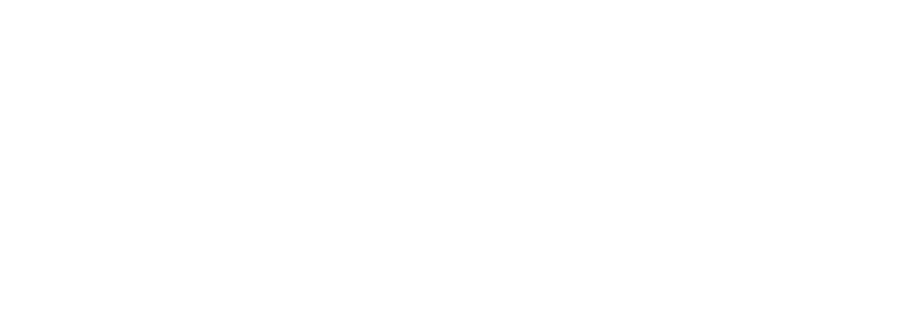

In [104]:
fig_asc, ax_asc = plt.subplots(1, 1, figsize=(10, 3.5))
# fig_asc.tight_layout(pad=4.0)
l = iterated
xax = np.arange(0, l+1)

mv_avg_score = np.zeros(l+1)
mv_avg_score[0] = (MIscores_k[0])
mv_avg_score[1] = (MIscores_k[0] + MIscores_k[1] )/2
mv_avg_score[2] = (MIscores_k[2] + MIscores_k[1] + MIscores_k[0])/3
mv_avg_score[3] = (MIscores_k[3] + MIscores_k[2] + MIscores_k[1] + MIscores_k[0])/4
for i in range(3, l+1):
    mv_avg_score[i] = (MIscores_k[i] + MIscores_k[i-1] + MIscores_k[i-2] + MIscores_k[i-3])/4


ax_asc.plot(xax, 10*MIscores_k[:l+1], 'o-', label="Scores")
# ax_asc.plot(xax, smoothed_score, color="teal")
ax_asc.plot(xax, 10*mv_avg_score[:l+1], color="red", lw=2, label="Smoothed with a moving average")
ax_asc.set_xlabel("Number of steps [n]")
ax_asc.set_ylabel("Score")
ax_asc.set_title("1D Optimisation: Normalised Mutual Information Score")
ax_asc.legend(loc="best")
# fig_asc.savefig(figpath+"AngleMIWThresh.png")


# ax_asc.set_title("1D Optimisation: Calibration Parameter $y$")
# fig_asc.savefig(figpath+"1DOptYMI.png")

<IPython.core.display.Javascript object>


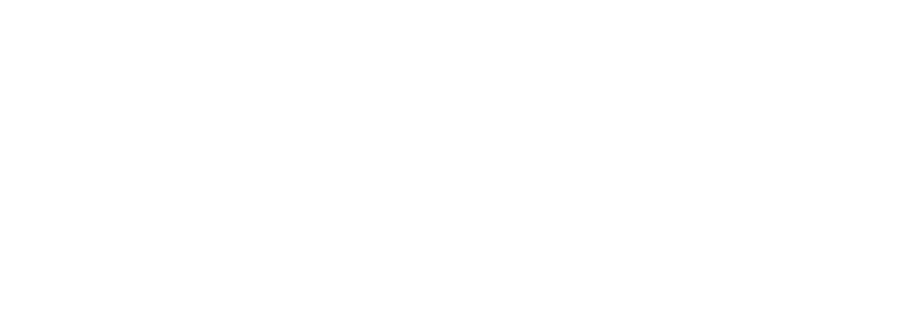

Text(0.5, 1.0, '1D Optimisation: Calibration Parameter $y$')

In [105]:
fig_asc, ax_asc = plt.subplots(1,1, figsize=(10, 3.5))
ax_asc.plot(xax,Ths_k[:l+1], 'o--', color="darkorange")
ax_asc.set_xlabel("Number of steps [n]")
ax_asc.set_ylabel("Calibration parameter")
# ax_asc.set_title("1D Optimisation: Parameter $\Theta_k$")
# fig_asc.savefig(figpath+"AngleThkWThresh.png")

ax_asc.set_title("1D Optimisation: Calibration Parameter $y$")
# fig_asc.savefig(figpath+"1DOptYTh.png")

<IPython.core.display.Javascript object>


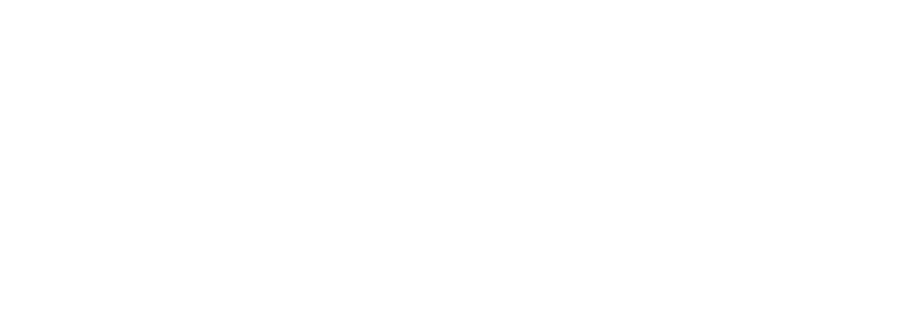

Text(0.5, 1.0, '1D Optimisation: Step size over iterations')

In [106]:
fig_asc, ax_asc = plt.subplots(1,1, figsize=(10, 3.5))
ax_asc.plot(xax,gns_k[:l+1], 'o--', color="olivedrab")
ax_asc.set_xlabel("Number of steps [n]")
ax_asc.set_ylabel("Step Size")
ax_asc.set_title("1D Optimisation: Step size over iterations")

# fig_asc.savefig(figpath+"Steps1D.png")


<IPython.core.display.Javascript object>


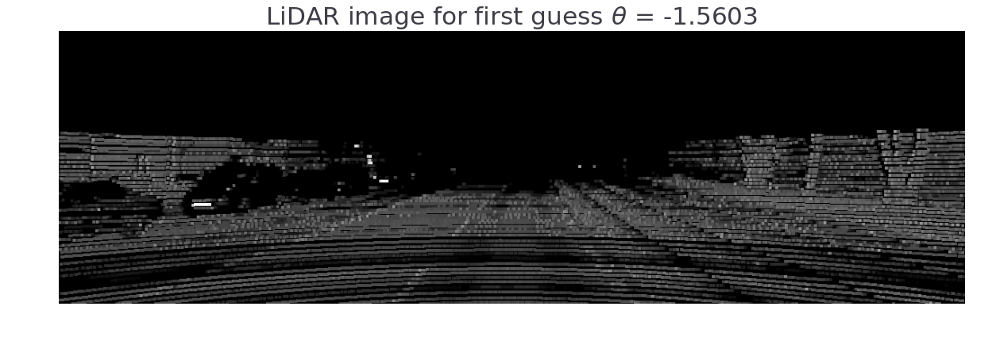

<IPython.core.display.Javascript object>


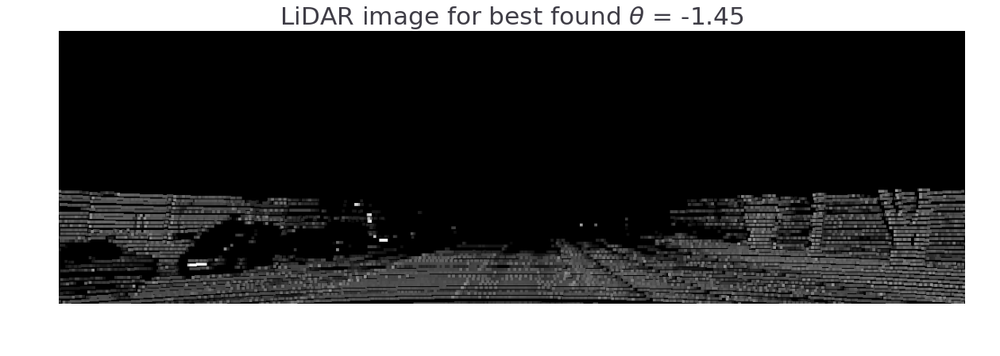

<IPython.core.display.Javascript object>


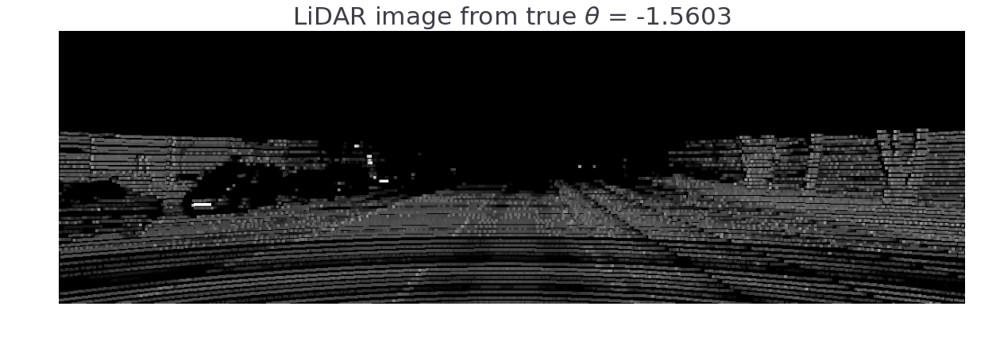

In [117]:
plt.close('all')
k=4
best_Th = OrigTh.copy()
best_Th[k] = end_individual_ths[k]

tst_Rt = make_Rt(best_Th)
proj_mat = make_proj_mat(data.calib.P_rect_00, data.calib.R_rect_00, tst_Rt)

img_cam_lidar, lid_pix_loc, lidar_intensities = render_lidar_on_image0(
    veloData[:, :3],
    veloData[:, 3],
    np.array(camera_data[0]),
    proj_mat,
    camera_data[0].width,
    camera_data[0].height,
    plt_depth=False, plt_pts_on_img = True)
img_lid_proj_d = pts_to_img(lid_pix_loc,
                                  lidar_intensities * 255, 
                                  [camera_data[0].height, camera_data[0].width],
                                  dilate=True)


start_th_k = OrigTh.copy()
start_th_k[k] = Th_0[k]
proj_mat_original = make_proj_mat(data.calib.P_rect_00, data.calib.R_rect_00, make_Rt(start_th_k))

img_cam_lidar_original, lid_pix_loc_original, lidar_intensities_original = render_lidar_on_image0(
    veloData[:, :3],
    veloData[:, 3],
    np.array(camera_data[0]),
    proj_mat_original,
    camera_data[0].width,
    camera_data[0].height,
    plt_depth=False, plt_pts_on_img = True)

img_lid_proj_d_orig = pts_to_img(lid_pix_loc_original,
                                  lidar_intensities_original * 255, 
                                  [camera_data[0].height, camera_data[0].width],
                                  dilate=True)



proj_mat_true = make_proj_mat(data.calib.P_rect_00, data.calib.R_rect_00,  make_Rt(OrigTh))
img_cam_lidar_true, lid_pix_loc_true, lidar_intensities_true = render_lidar_on_image0(
    veloData[:, :3],
    veloData[:, 3],
    np.array(camera_data[0]),
    proj_mat_true,
    camera_data[0].width,
    camera_data[0].height,
    plt_depth=False, plt_pts_on_img = True)
img_lid_proj_d_true = pts_to_img(lid_pix_loc_true,
                                  lidar_intensities_true * 255, 
                                  [camera_data[0].height, camera_data[0].width],
                                  dilate=True)





fig_orig, ax_orig = plt.subplots(1,1, figsize=(14,5))
fig_orig.tight_layout(pad=2.0)
ax_orig.imshow(img_lid_proj_d_orig)
ax_orig.axis('off')
ax_orig.set_title(r"LiDAR image for first guess $\theta$ = {0:.4f}".format(Th_0[k]),fontsize=25)
# fig_orig.savefig(figpath+"InitialAngleWThresh.png")
# fig_orig.savefig(figpath+"Initial1DOptYTh.png")
# plt.show()


fig_op, ax_op = plt.subplots(1,1, figsize=(14,5))
fig_op.tight_layout(pad=2.0)
ax_op.imshow(img_lid_proj_d)
ax_op.axis('off')
ax_op.set_title(r"LiDAR image for best found $\theta$ = {0:.4f}".format(best_Th[k]),fontsize=25)
# fig_op.savefig(figpath+"OptimisedAngleWThresh.png")
# fig_op.savefig(figpath+"Optimised1DOptYTh.png")
# plt.show()



fig_e, ax_e = plt.subplots(1,1, figsize=(14,5))
fig_e.tight_layout(pad=2.0)
ax_e.imshow(img_lid_proj_d_true,cmap='gray')
ax_e.axis('off')
ax_e.set_title(r"LiDAR image from true $\theta$ = {0:.4f}".format(OrigTh[k]),fontsize=25)
# # # # # # # fig_e.savefig(figpath+"TrueAngleWThresh.png")
# fig_e.savefig(figpath+"True1DOptYTh.png")

plt.show()
# camera_data[0]

In [121]:
7000/pixel_locations.shape[0]

0.35891914064502894

<IPython.core.display.Javascript object>


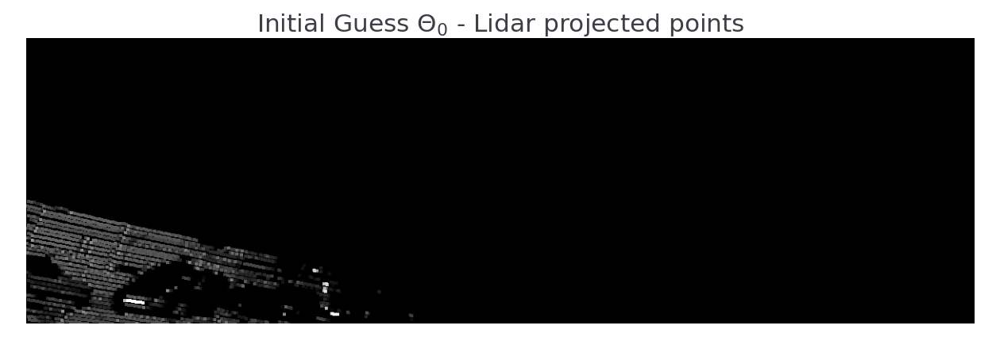

<IPython.core.display.Javascript object>


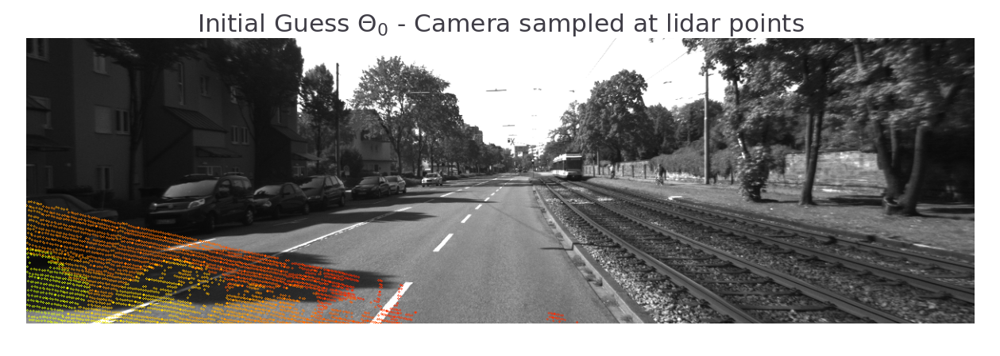

Initial Guess $\Theta_0$ [-0.00114363 -0.13190868 -0.01490612  0.01595572 -1.30227817  1.73007518]
(3069, 2)


<IPython.core.display.Javascript object>


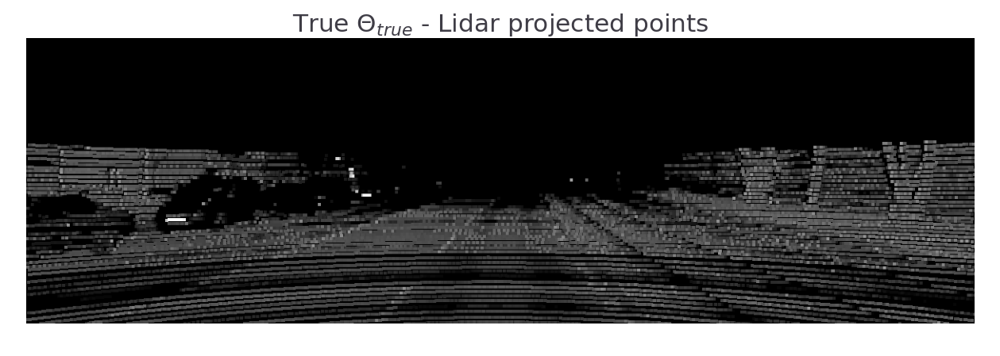

<IPython.core.display.Javascript object>


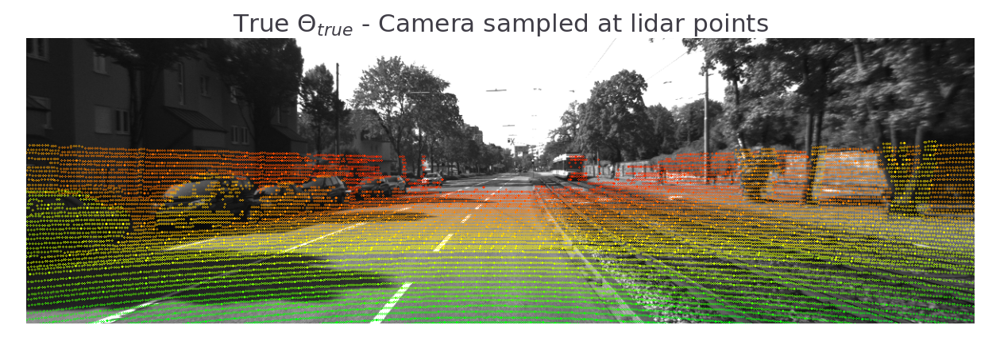

True $\Theta_{true}$ [-0.00279682 -0.07510879 -0.2721328   0.01189895 -1.56034409  1.54833245]
(18681, 2)


<IPython.core.display.Javascript object>


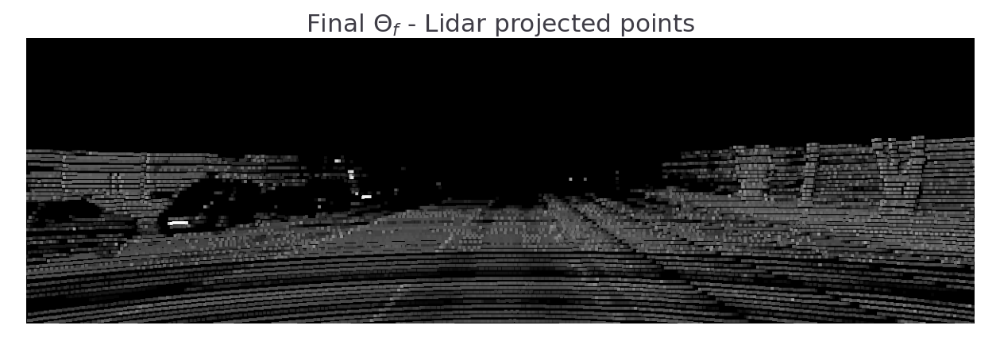

<IPython.core.display.Javascript object>


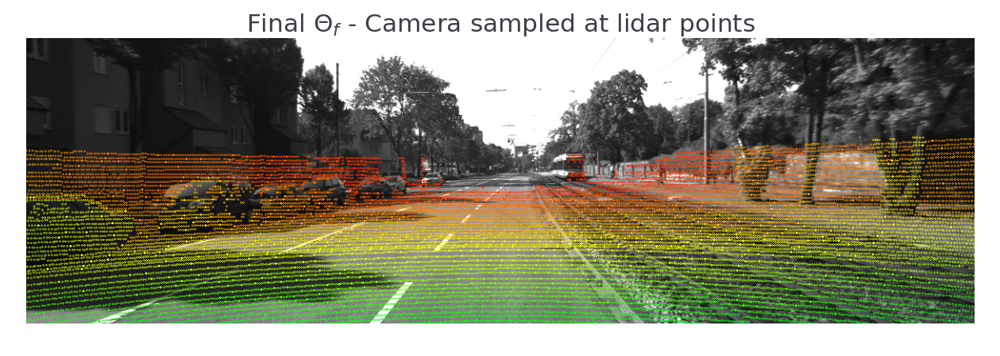

Final $\Theta_f$ [-0.096  -0.0818 -0.0227  0.0103 -1.5594  1.5385]
(19503, 2)


In [108]:

starting_Theta = frame_Thetas[0]
end_Theta = frame_Thetas[-1]
# best_found_Theta = best_Theta
true_Theta = OrigTh


Th_arr = [starting_Theta,  true_Theta, end_Theta]
titles = ["Initial Guess $\Theta_0$", "True $\Theta_{true}$", "Final $\Theta_f$"]
saveNamesL = ["MultiGradDecStart_L.png", "MultiGradDecTrue_L.png", "MultiGradDecFinal_L.png"]
saveNamesIL = ["MultiGradDecStart_LonI.png", "MultiGradDecTrue_LonI.png", "MultiGradDecFinal_LonI.png"]




num_plots = len(Th_arr)

# for i in range(0, num_plots):

cmap = plt.cm.get_cmap('hsv', 256)
cmap = np.array([cmap(i) for i in range(256)])[:, :3] * 255
# cmap[:,1] = cmap[:,1]*0.6

for i, tst_Th in enumerate(Th_arr):
    fig_L, ax_L = plt.subplots(1,1, figsize=(14,5))
    
    fig_IL, ax_IL = plt.subplots(1,1,figsize=(14,5))
    
    print(titles[i], tst_Th)
    tst_Rt = make_Rt(tst_Th)
    proj_mat = make_proj_mat(data.calib.P_rect_00, data.calib.R_rect_00, tst_Rt)

    img_cam_lidar, lid_pix_loc, lidar_intensities = render_lidar_on_image0(
        veloData[:, :3],
        veloData[:, 3],
        np.array(camera_data[0]),
        proj_mat,
        camera_data[0].width,
        camera_data[0].height,
        plt_depth=False, plt_pts_on_img = True)
    print(lid_pix_loc.shape)



    img_Img_lidar_proj_d = pts_to_img(lid_pix_loc,
                                      lidar_intensities * 255, 
                                      [camera_data[0].height, camera_data[0].width],
                                      dilate=True)


    img_cam0_s_lidar_d = pts_to_img(lid_pix_loc,
                                    sample_img_at_lidar(lid_pix_loc,
                                                        camera_data[0]),
                                    [camera_data[0].height, camera_data[0].width],
                                    dilate=True)
    
    
    
    
    
    
    
    

    
    pixel_locations, depths, intensities = proj_lidar_to_image0(veloData[:, :3], veloData[:, 3], proj_mat, camera_data[0].width, camera_data[0].height)
  
    
    non_z= intensities>0
    intensities[non_z] = np.exp(intensities[non_z])
    plt_depth = True
    
    img =cv2.cvtColor(np.array(camera_data[0]), cv2.COLOR_RGB2BGR)

    for p in range(pixel_locations.shape[0]):
        if plt_depth:
            colour = cmap[int(540 / depths[p]), :]
        else:

            colour = cmap[int(90*intensities[p]), :]

        cv2.circle(img, (int(np.round(pixel_locations[p, 0])),
                         int(np.round(pixel_locations[p, 1]))),
                   1, color=tuple(colour), thickness=1)
    
    
    

    ax_L.imshow(img_Img_lidar_proj_d)
    ax_L.set_title("{} - Lidar projected points".format(titles[i]), fontsize=25)
    ax_L.axis('off')
    
    

    ax_IL.imshow(img)
    ax_IL.set_title("{} - Camera sampled at lidar points".format(titles[i]), fontsize=25)
    ax_IL.axis('off')
    
    
    
    fig_L.tight_layout(pad=2.0)
    fig_IL.tight_layout(pad=2.0)
    
    
##    fig_L.savefig(figpath+"XYZ"+saveNamesL[i])
##    fig_IL.savefig(figpath+"XYZ"+saveNamesIL[i])
    
# ##    fig_L.savefig(figpath+"AllTh"+saveNamesL[i])
# ##    fig_IL.savefig(figpath+"AllTh"+saveNamesIL[i])

## Now Gradient Ascent for all of the variables
----



Steps:
- Given some incorect parameters $\Theta^{(0)}$:
-  . . . . . . . . . .  . . . . . . . 

- Start with $x$
    - Find the value that gives the best MI score. 
    - Use gradient ascent as done above
    
- Update $\Theta^{(1)}_x$ with the new best found $x$ parameter
- Move on to Y
- Repeat for all the rest of the parameters of  $_k$ in $\Theta^{1}$
<br>
<br>

- Start again with $x$ from the previous iteration's $\Theta^{(1)}$

In [33]:
def full_grad_ascent(Theta0, Gns_0, gns_0, img, velo, best_learning_rates, num_k = 3,  num_iterations=30, max_sub_its =30, use_histogram = True, prints = False, quiet=False):

    Thetas = np.zeros((num_iterations, Th_0.shape[0]))

    Thetas[0] = np.hstack((Theta0[:-3],(OrigTh[-3:])))
#     if not quiet:
    print("Theta_",0,":\t", Thetas[0])

    Big_scores = np.zeros((num_iterations))

    for n in range(1,num_iterations):
        if not quiet: print("Th_k MI:\t", end="")
            
        for k in range(num_k):
            alpha = np.abs(Thetas[n-1,k] * best_learning_rates[k]) 

            end_Th_k, Ths_k, Gns_k, gns_k, MIscores_k, iterated = grad_decent_k(k,
                                                                                Thetas[n-1],
                                                                                Gns_0,
                                                                                gns_0,
                                                                                velo,
                                                                                img,
                                                                                min_step=0.001,
                                                                                learning_rate=alpha,
                                                                                delta_theta_thresh=0.0001,
                                                                                max_its=max_sub_its,
                                                                                use_hist=use_histogram, prints = prints)
            
            maxscore = np.max(MIscores_k)
            if maxscore>0:
                Thetas[n,k] = Ths_k[np.argmax(MIscores_k)]
            if not quiet: print(maxscore, end="\t")


        Thetas[n] = np.hstack((Thetas[n,:num_k],np.copy(OrigTh[num_k:])))
        if not quiet: print()
        Big_scores[n] = score_Th_k(k,Thetas[n], Thetas[n], data.calib, veloData, camera_data[0], hist=True)
        
        print("Theta_",n,":\t", Thetas[n])
        if not quiet: 
            print("Target Th:\t", OrigTh)
            print("Theta Score:\t", Big_scores[n])
        # Adjusting the learning rates
        best_learning_rates = np.multiply(best_learning_rates, 0.98)
    
    
    best_score = np.max(Big_scores)
    best_ind = np.argmax(Big_scores)
    best_Th = Thetas[best_ind]
    
    return best_Th, best_score, Thetas, Big_scores

In [70]:
noisyTh, noisyRt = mod_calib(data.calib, errorMultiplier=2)
OrigTh = getTheta(data.calib.T_cam0_velo)
Th_0, Gns_0, gns_0 = init_Thn_Gn_gn(noisyRt)

num_big_its = 10
num_sub_its = 20
# num_ks = 3
# Th_0 = np.hstack(([-1,-1,-1], OrigTh[-3:]))

num_ks=6

# num_big_its = 10
# num_sub_its = 50

if num_ks==6:
    Th_0 = np.copy(noisyTh)
    

"""
-------------------------------------------
To make things a little harder, let x,y,z all be -1.
-------------------------------------------
"""

frame_nums = np.arange(0,9, 2) # When the frames were imported they were stepped in 5's
frame_Thetas = np.zeros((frame_nums.shape[0]+1, len(Th_0)))
frame_Thetas[0] = Th_0

num_iterations = 30
best_learning_rates = np.array([0.1, 0.1, 0.1, 0.005, 0.005, 0.005])

frame_scores = np.zeros(len(frame_nums)+1)
velo_0 = data.get_velo(0)
img_0 = data.get_cam0(0)

frame_scores[0] = score_Th_k(0, Th_0, Th_0, data.calib, velo_0, img_0)

# frame_kde_scores = np.zeros(frame_Thetas.shape[0])
# frame_kde_scores[0] = score_Th_k(0, Th_0, Th_0, data.calib, velo_0, img_0, hist=False)

hist_Ths = np.zeros(((frame_nums.shape[0])*(num_big_its), len(Th_0)))
hist_scores = np.zeros(((frame_nums.shape[0])*(num_big_its)))
for s, f in enumerate(frame_nums):
    print("===============================================")
    print("FRAME #{}".format(f*5))
    print("===============================================")
    
    
    velo_f = data.get_velo(f)
    img_f = data.get_cam0(f)
    print("Training ")
    F_T, F_S, H_T, H_S = full_grad_ascent(frame_Thetas[s], Gns_0, gns_0, img_f, velo_f, best_learning_rates, num_k=num_ks,
                                          num_iterations=num_big_its, max_sub_its =num_sub_its, quiet=True)
    
    frame_Thetas[s+1] = F_T
    frame_scores[s+1] = F_S
    hist_Ths[(s)*num_big_its:(s+1)*num_big_its] = H_T
    hist_scores[(s)*num_big_its:(s+1)*num_big_its] = H_S
#     frame_kde_score
    print()
    print("TrueTh:\t", OrigTh)
    print("Theta:\t", frame_Thetas[s+1])
    print("Score:\t", frame_scores[s+1])
    best_learning_rates = best_learning_rates*0.5
#     frame_kde_scores[s] = score_Th_k(0, frame_Thetas[s], frame_Thetas[s], data.calib, velo_f, img_f, hist=False)
    
    

FRAME #0
Training 
Theta_ 0 :	 [-1.14363103e-03 -1.31908679e-01 -1.49061246e-02  1.18989478e-02
 -1.56034409e+00  1.54833245e+00]
Theta_ 1 :	 [-0.0057 -0.1293 -0.0074  0.0115 -1.567   1.5385]
Theta_ 2 :	 [-0.0093 -0.126  -0.0101  0.0121 -1.5674  1.506 ]
Theta_ 3 :	 [-0.0111 -0.1157 -0.0128  0.0137 -1.5633  1.5095]
Theta_ 4 :	 [-0.0165 -0.1242 -0.0081  0.0144 -1.5638  1.502 ]
Theta_ 5 :	 [-0.0153 -0.125  -0.0045  0.0144 -1.5641  1.5003]
Theta_ 6 :	 [-0.0194 -0.1228 -0.0069  0.0139 -1.543   1.5112]
Theta_ 7 :	 [-0.0253 -0.1211 -0.0125  0.0124 -1.533   1.5024]
Theta_ 8 :	 [-0.0342 -0.1211 -0.0116  0.0124 -1.5273  1.4889]
Theta_ 9 :	 [-0.0413 -0.0931 -0.0126  0.009  -1.5108  1.4828]

TrueTh:	 [-0.00279682 -0.07510879 -0.2721328   0.01189895 -1.56034409  1.54833245]
Theta:	 [-0.0413 -0.0931 -0.0126  0.009  -1.5108  1.4828]
Score:	 0.04016545675897584
FRAME #10
Training 
Theta_ 0 :	 [-0.0413     -0.0931     -0.0126      0.01189895 -1.56034409  1.54833245]
Theta_ 1 :	 [-0.0345 -0.0963 -0.0137

In [35]:
print(frame_Thetas)
print(OrigTh)
print()
print()
for k in [OrigTh, Th_0, frame_Thetas[-1]]:
    for l in range(len(OrigTh)):
        print(np.round(k[l],4), end = " & ")
    print()

[[-1.14363103e-03 -1.31908679e-01 -1.49061246e-02  1.59557158e-02
  -1.30227817e+00  1.73007518e+00]
 [-9.30000000e-03 -1.30900000e-01 -5.30000000e-03  1.13000000e-02
  -1.55240000e+00  1.51780000e+00]
 [-1.99000000e-02 -1.46300000e-01 -5.30000000e-03  1.13000000e-02
  -1.49990000e+00  1.49060000e+00]
 [-2.75000000e-02 -1.42400000e-01 -6.40000000e-03  1.05000000e-02
  -1.56150000e+00  1.53630000e+00]
 [-3.11000000e-02 -1.37800000e-01 -7.70000000e-03  1.15000000e-02
  -1.55300000e+00  1.54833245e+00]
 [-3.33000000e-02 -1.37900000e-01 -4.80000000e-03  1.27000000e-02
  -1.54560000e+00  1.54990000e+00]]
[-0.00279682 -0.07510879 -0.2721328   0.01189895 -1.56034409  1.54833245]


-0.0028 & -0.0751 & -0.2721 & 0.0119 & -1.5603 & 1.5483 & 
-0.0011 & -0.1319 & -0.0149 & 0.016 & -1.3023 & 1.7301 & 
-0.0333 & -0.1379 & -0.0048 & 0.0127 & -1.5456 & 1.5499 & 


In [36]:
tmp_hist_scores = hist_scores.copy()
tmp_hist_Ths = hist_Ths.copy()

<IPython.core.display.Javascript object>


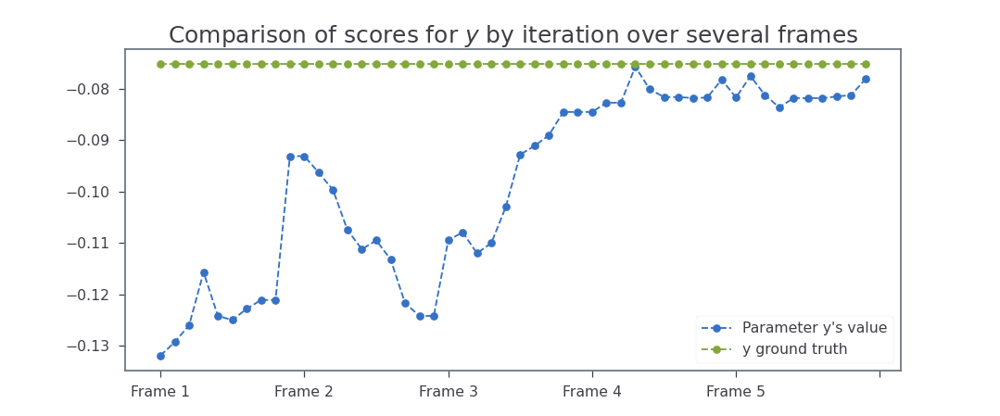

In [76]:
tmpfig, tmpax = plt.subplots(1,1, figsize=(12,5))
k = 1
param_names = ['x', 'y', 'z', 'phi', 'theta', 'psi']
# tmpax.plot(frame_scores[:,k], label="MI score for {}".format(param_names[k]))

tmpax.plot(hist_Ths[:,k],"o--", label="Parameter {}'s value".format(param_names[k]))
gt = np.ones(hist_Ths[:,k].shape[0])*OrigTh[k]
tmpax.plot(gt,"o--", label="{} ground truth".format(param_names[k]))

tmpax.legend(loc="best")
tmpax.set_title("Comparison of scores for ${}$ by iteration over several frames".format(param_names[k]), fontsize=20)


tmpfig.canvas.draw()
labels = [item.get_text() for item in tmpax.get_xticklabels()]
labels[1] = 'Frame 1'
labels[2] = 'Frame 2'
labels[3] = 'Frame 3'
labels[4] = 'Frame 4'
labels[5] = 'Frame 5'
labels[6] = ''
tmpax.set_xticklabels(labels)



# tmpfig.savefig(figpath + "avgingFrames{}.png".format(param_names[k]))

In [65]:
OrigTh

array([-0.00279682, -0.07510879, -0.2721328 ,  0.01189895, -1.56034409,
        1.54833245])

# Looking into the data
---
<br>
<br>
<br>
<br>
<br>
<br>




In [251]:
hist_scores = tmp_hist_scores*10
hist_scores = np.where(hist_scores<=0.4, 0.43, hist_scores)
hist_Ths = tmp_hist_Ths

<IPython.core.display.Javascript object>


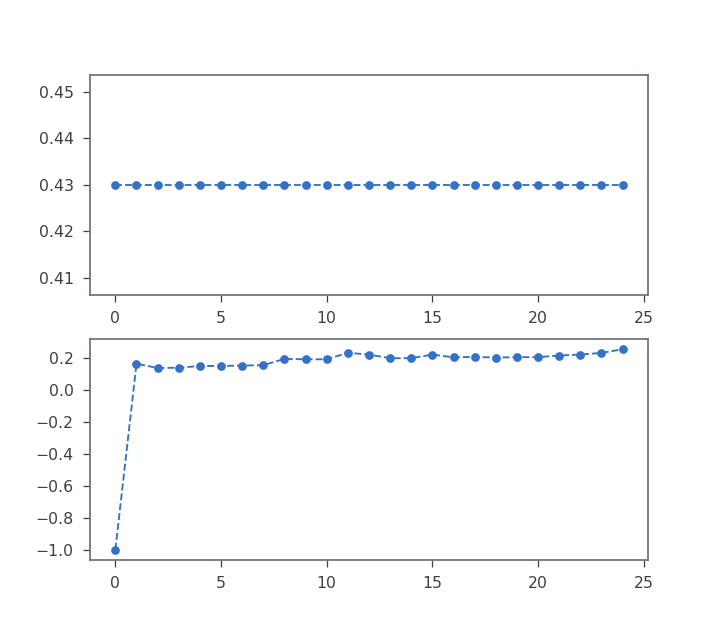

In [252]:

fig_his, ax_his = plt.subplots(2,1)
xax = range(0, hist_scores.shape[0])
ax_his[0].plot(xax, hist_scores, 'o--')


ax_his[1].plot(xax, hist_Ths[:,1],"o--")

In [253]:
print("True Th:\t",OrigTh)

ind_best_Theta = np.argmax(frame_scores)
best_Theta = frame_Thetas[ind_best_Theta]

print("Best Th:\t", best_Theta)
print("Best score:\t ", frame_scores[ind_best_Theta])

True Th:	 [-0.00279682 -0.07510879 -0.2721328   0.01189895 -1.56034409  1.54833245]
Best Th:	 [ 0.0482  0.1518 -0.8859  0.0143 -1.4771  1.5426]
Best score:	  0.03993477434770595


<IPython.core.display.Javascript object>


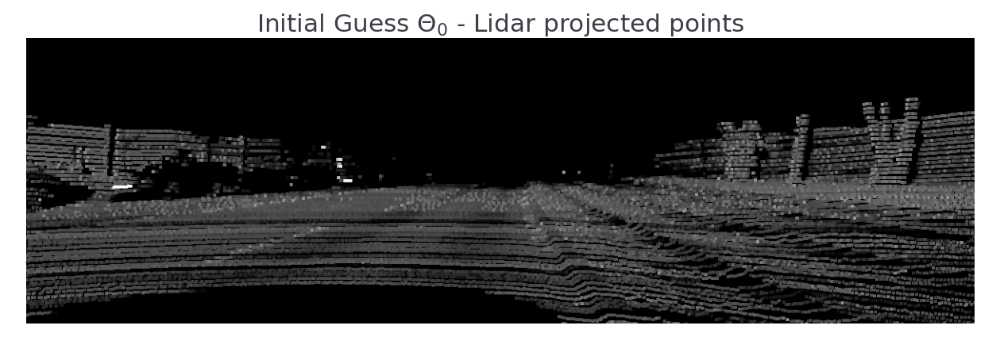

<IPython.core.display.Javascript object>


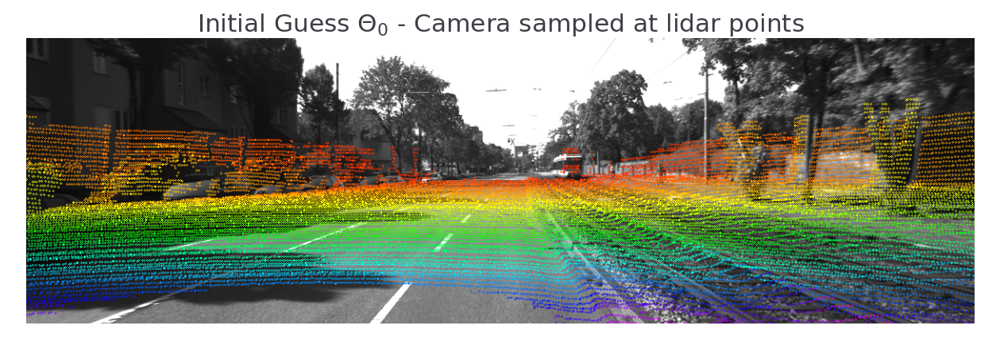

Initial Guess $\Theta_0$ [-1.         -1.         -1.          0.01189895 -1.56034409  1.54833245]
(23621, 2)


<IPython.core.display.Javascript object>


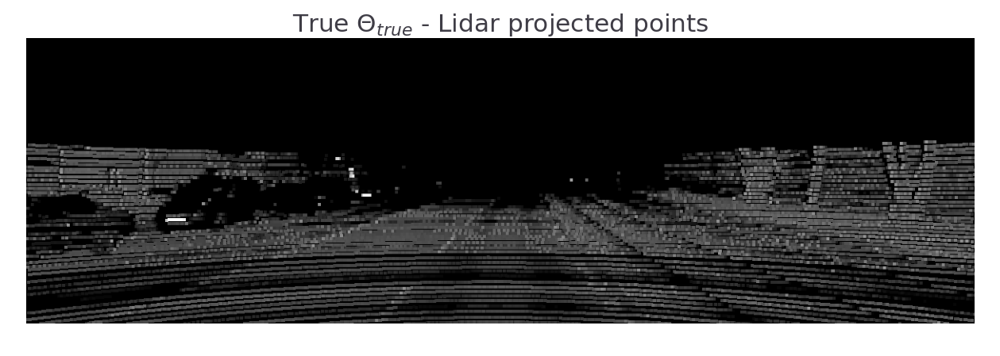

<IPython.core.display.Javascript object>


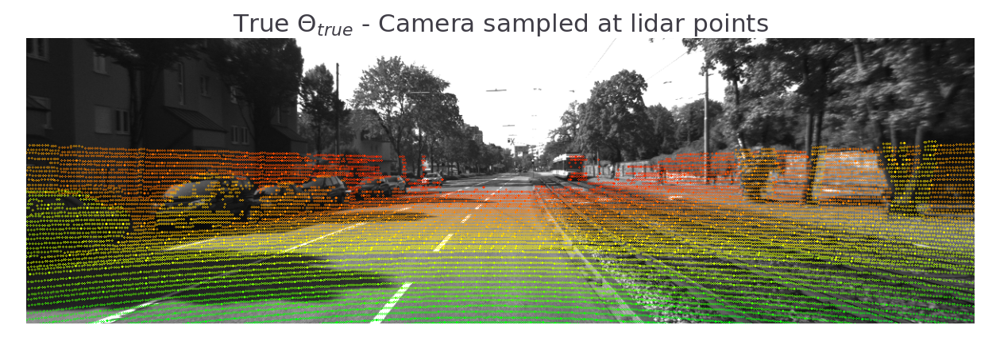

True $\Theta_{true}$ [-0.00279682 -0.07510879 -0.2721328   0.01189895 -1.56034409  1.54833245]
(18681, 2)


<IPython.core.display.Javascript object>


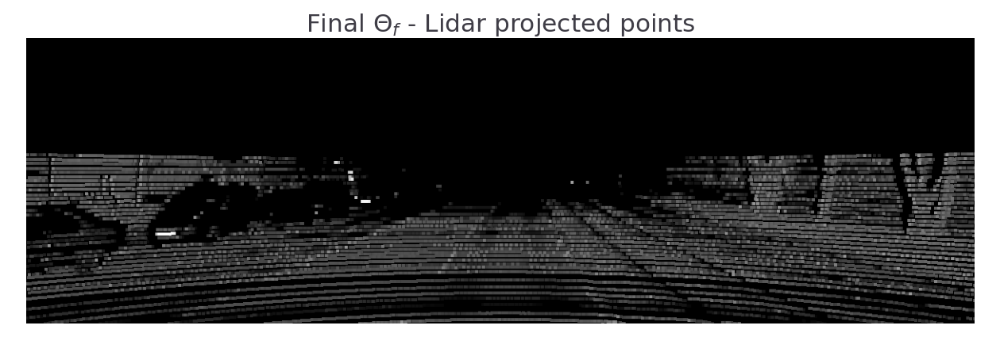

<IPython.core.display.Javascript object>


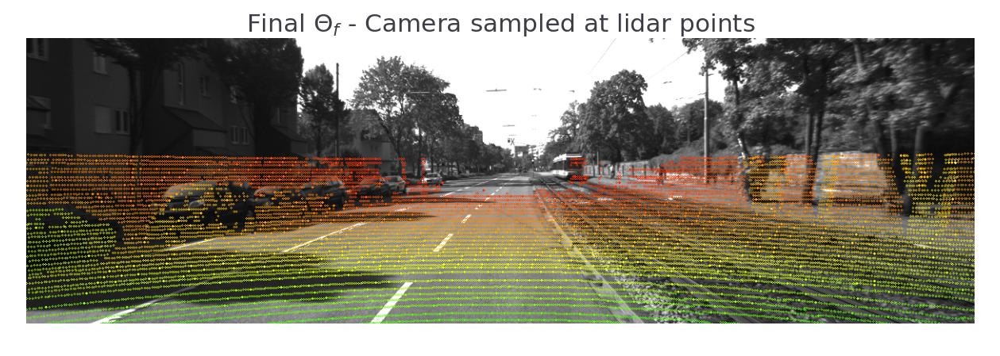

Final $\Theta_f$ [ 0.0577      0.2582     -0.8082      0.01189895 -1.56034409  1.54833245]
(15236, 2)


In [278]:

starting_Theta = frame_Thetas[0]
end_Theta = frame_Thetas[-1]
# best_found_Theta = best_Theta
true_Theta = OrigTh


Th_arr = [starting_Theta,  true_Theta, end_Theta]
titles = ["Initial Guess $\Theta_0$", "True $\Theta_{true}$", "Final $\Theta_f$"]
saveNamesL = ["MultiGradDecStart_L.png", "MultiGradDecTrue_L.png", "MultiGradDecFinal_L.png"]
saveNamesIL = ["MultiGradDecStart_LonI.png", "MultiGradDecTrue_LonI.png", "MultiGradDecFinal_LonI.png"]




num_plots = len(Th_arr)

# for i in range(0, num_plots):

cmap = plt.cm.get_cmap('hsv', 256)
cmap = np.array([cmap(i) for i in range(256)])[:, :3] * 255
# cmap[:,1] = cmap[:,1]*0.6

for i, tst_Th in enumerate(Th_arr):
    fig_L, ax_L = plt.subplots(1,1, figsize=(14,5))
    
    fig_IL, ax_IL = plt.subplots(1,1,figsize=(14,5))
    
    print(titles[i], tst_Th)
    tst_Rt = make_Rt(tst_Th)
    proj_mat = make_proj_mat(data.calib.P_rect_00, data.calib.R_rect_00, tst_Rt)

    img_cam_lidar, lid_pix_loc, lidar_intensities = render_lidar_on_image0(
        veloData[:, :3],
        veloData[:, 3],
        np.array(camera_data[0]),
        proj_mat,
        camera_data[0].width,
        camera_data[0].height,
        plt_depth=False, plt_pts_on_img = True)
    print(lid_pix_loc.shape)



    img_Img_lidar_proj_d = pts_to_img(lid_pix_loc,
                                      lidar_intensities * 255, 
                                      [camera_data[0].height, camera_data[0].width],
                                      dilate=True)


    img_cam0_s_lidar_d = pts_to_img(lid_pix_loc,
                                    sample_img_at_lidar(lid_pix_loc,
                                                        camera_data[0]),
                                    [camera_data[0].height, camera_data[0].width],
                                    dilate=True)
    
    
    
    
    
    
    
    

    
    pixel_locations, depths, intensities = proj_lidar_to_image0(veloData[:, :3], veloData[:, 3], proj_mat, camera_data[0].width, camera_data[0].height)
  
    
    non_z= intensities>0
    intensities[non_z] = np.exp(intensities[non_z])
    plt_depth = True
    
    img =cv2.cvtColor(np.array(camera_data[0]), cv2.COLOR_RGB2BGR)

    for p in range(pixel_locations.shape[0]):
        if plt_depth:
            colour = cmap[int(540 / depths[p]), :]
        else:

            colour = cmap[int(90*intensities[p]), :]

        cv2.circle(img, (int(np.round(pixel_locations[p, 0])),
                         int(np.round(pixel_locations[p, 1]))),
                   1, color=tuple(colour), thickness=1)
    
    
    

    ax_L.imshow(img_Img_lidar_proj_d)
    ax_L.set_title("{} - Lidar projected points".format(titles[i]), fontsize=25)
    ax_L.axis('off')
    
    

    ax_IL.imshow(img)
    ax_IL.set_title("{} - Camera sampled at lidar points".format(titles[i]), fontsize=25)
    ax_IL.axis('off')
    
    
    
    fig_L.tight_layout(pad=2.0)
    fig_IL.tight_layout(pad=2.0)
    
    
##    fig_L.savefig(figpath+"XYZ"+saveNamesL[i])
##    fig_IL.savefig(figpath+"XYZ"+saveNamesIL[i])
    
# ##    fig_L.savefig(figpath+"AllTh"+saveNamesL[i])
# ##    fig_IL.savefig(figpath+"AllTh"+saveNamesIL[i])

In [276]:
540/np.min(depths)

244.49320310431236

In [ ]:
plt.close('all')
from jupyterthemes import jtplot
jtplot.style(theme='grade3', context='notebook', ticks=True, grid=False)

In [ ]:
print(OrigTh)
print(frame_Thetas[-1])


<IPython.core.display.Javascript object>


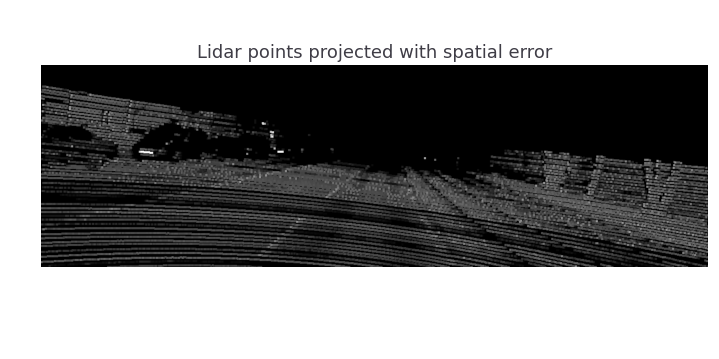

(20679, 2)


Text(0.5, 1.0, 'Lidar points projected with spatial error')

In [133]:
fig_t, ax_t = plt.subplots(1,1,figsize=(8, 4))
fig_t.tight_layout(pad=0)
img = data.get_cam0(3)

noisyTh, noisyRt = mod_calib(data.calib, errorMultiplier=0.51)
tst_Rt = make_Rt(noisyTh)
proj_mat = make_proj_mat(data.calib.P_rect_00, data.calib.R_rect_00, tst_Rt)

img_cam_lidar, lid_pix_loc, lidar_intensities = render_lidar_on_image0(
    veloData[:, :3],
    veloData[:, 3],
    np.array(img),
    proj_mat,
    img.width,
    img.height,
    plt_depth=False, plt_pts_on_img = True)
print(lid_pix_loc.shape)



img_Img_lidar_proj_d = pts_to_img(lid_pix_loc,
                                  lidar_intensities * 255, 
                                  [img.height, img.width],
                                  dilate=True)

ax_t.imshow(img_Img_lidar_proj_d)

ax_t.axis("off")
ax_t.set_title("Lidar points projected with spatial error")
# fig_t.savefig(figpath+"LidarSampleSError.png")


<IPython.core.display.Javascript object>


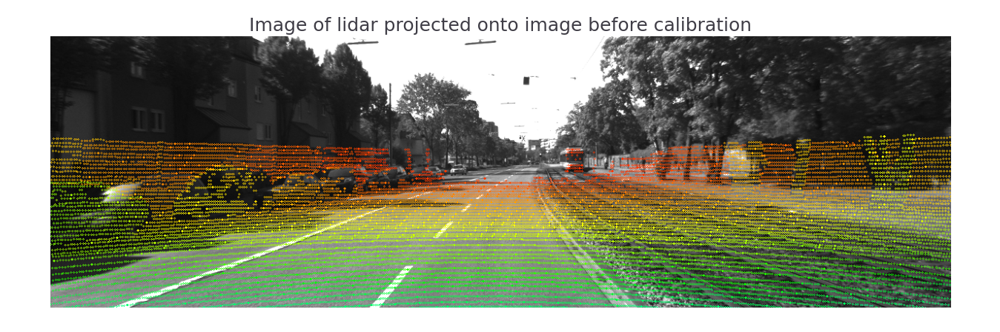

(18681, 2)


In [132]:
fig_se, ax_se = plt.subplots(1,1,figsize=(15,5))
fig_se.tight_layout(pad=0)


img = data.get_cam0(3)
# proj_mat = make_proj_mat(data.calib.P_rect_00, data.calib.R_rect_00, data.calib.T_cam0_velo)
noisyTh, noisyRt = mod_calib(data.calib, errorMultiplier=0.51)
# tst_Rt = make_Rt(noisyTh)
tst_Rt = data.calib.T_cam0_velo
proj_mat = make_proj_mat(data.calib.P_rect_00, data.calib.R_rect_00, tst_Rt)

img_cam_lidar, lid_pix_loc, lidar_intensities = render_lidar_on_image0(
    veloData[:, :3],
    veloData[:, 3],
    np.array(img),
    proj_mat,
    img.width,
    img.height,
    plt_depth=False, plt_pts_on_img = True)
print(lid_pix_loc.shape)

plt_depth=False

# img_Img_lidar_proj_dse = pts_to_img(lid_pix_loc,
#                                   lidar_intensities * 255, 
#                                   [img.height, img.width],
#                                   dilate=True)
img_cam0_s_lidar_d = pts_to_img(lid_pix_loc,
                                sample_img_at_lidar(lid_pix_loc,
                                                    img),
                                [img.height, img.width],
                                dilate=True)

pixel_locations, depths, intensities = proj_lidar_to_image0(veloData[:, :3], veloData[:, 3], proj_mat, img.width, img.height)


img = data.get_cam0(3)
img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
cmap = plt.cm.get_cmap('hsv', 256)
cmap = np.array([cmap(i) for i in range(256)])[:, :3] * 255



non_z= intensities>0
intensities[non_z] = np.exp(intensities[non_z])
plt_depth = True


for i in range(pixel_locations.shape[0]):
    if plt_depth:
        colour = cmap[int(640 / depths[i]), :]
    else:
        
        colour = cmap[int(90*intensities[i]), :]

    cv2.circle(img, (int(np.round(pixel_locations[i, 0])),
                     int(np.round(pixel_locations[i, 1]))),
               1, color=tuple(colour), thickness=1)

# ax_se.imshow(img_cam0_s_lidar_d, cmap="gray")
ax_se.imshow(img)
ax_se.axis("off")
ax_se.set_title("Image of lidar projected onto image before calibration",fontsize=20)
# plt.savefig(figpath+"LidarOnCamera_Uncalibrated.png")
plt.tight_layout(pad=2.0)

In [138]:
# np.unique(intensities)
OrigTh

array([-0.00279682, -0.07510879, -0.2721328 ,  0.01189895, -1.56034409,
        1.54833245])

# Debugging
---
<br>
<br>
<br>
<br>
<br>
<br>
<br>


In [ ]:
Theta_nl1 = Th
# Theta_n = Th0
Theta_n = Th
calib = data.calib
velo= veloData
img = camera_data[0]
hist = False

In [ ]:
def tmp_MI(x, y, threshold=3000,too_small_reduction = 0.1, use_hist = True):
    """
    Return the mutual information score for a joint histogram
    """
    
    X = np.array(x).ravel()
    Y = np.array(y).ravel()
    
    too_small = False
    
    if len(X)*len(Y) < threshold:
        too_small=True

    if use_hist:
        Z, _, _ = np.histogram2d(X, Y, bins=255)
    else:                   
        Z = get_kde_2D(X, Y)
    
    plt.imshow(Z)

    p_joint = Z / np.sum(Z)
#     print("KDE tot sum = ", np.sum(Z))
    p_x = np.sum(p_joint, axis=1)
#     print("KDE p_x = ", p_x)
    p_y = np.sum(p_joint, axis=0)
#     print("KDE p_y = ", p_y)

    px_py = p_x[:, None] * p_y[None, :]
    non_zeros = p_joint > 0  # Only non-zero pxy values contribute to the sum
    print("num_zeros", np.sum(px_py ==0))
    if too_small:
        print("Overlap too small, reducing score")
        return too_small_reduction * np.sum(p_joint[non_zeros] *
                      np.log(p_joint[non_zeros] / px_py[non_zeros]))
    else:
        return np.sum(p_joint[non_zeros] *
                      np.log(p_joint[non_zeros] / px_py[non_zeros]))
    
   

In [ ]:
fig = plt.figure()

In [ ]:
    this_Thn = Theta_nl1.copy()
    this_Thn[k] = Theta_n[k]

    this_Rt = make_Rt(this_Thn)
    proj_mat = make_proj_mat(calib.P_rect_00, calib.R_rect_00, this_Rt)

    pixel_locations, _, intensities = proj_lidar_to_image0(
        velo[:, :3], velo[:, 3], proj_mat, img.height, img.width)
    syn_cam_lidar = sample_img_at_lidar(pixel_locations, img)
    
    scaled_intens = np.floor(intensities*255)
    
#     Removing zeros:
    non_zeros = np.where((scaled_intens>0) & (syn_cam_lidar>0))
    scaled_intens = scaled_intens[non_zeros]
    syn_cam_lidar = syn_cam_lidar[non_zeros]
    
    score = tmp_MI(scaled_intens,
                   syn_cam_lidar,
                   use_hist=hist)

In [ ]:
# KDE tot sum =  6879.0

In [ ]:
best_possible_MI = score_Th_k(k, OrigTh, OrigTh, data.calib, data.get_velo(frame_num), camera_data[0], hist=True)
# print(best_possible_MI)

In [ ]:
# Th_np1 = np.array([-0.00237525,  -0.08959276, -0.2721328,  0.01189895,  -1.48651841,   1.54833245])
# min_step+alpha*(1-min_step**(1/np.sqrt(1+0.01)))

# Exporting the session with pickle (dill)
---
<br>
<br>
<br>


In [ ]:
dill.dump_session('Optimisation.db')